## **SALT AND PEPPER IMAGE FILTERING**

In [7]:
# Make sure that we have opencv
!pip install opencv-python

In [8]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

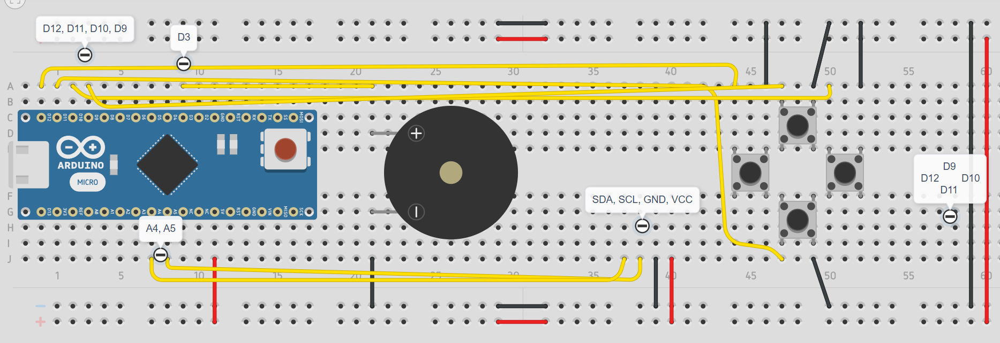

(642, 1867, 4)


In [9]:
# Open our original image
img = cv2.imread('Tetris.png', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
print(img.shape)

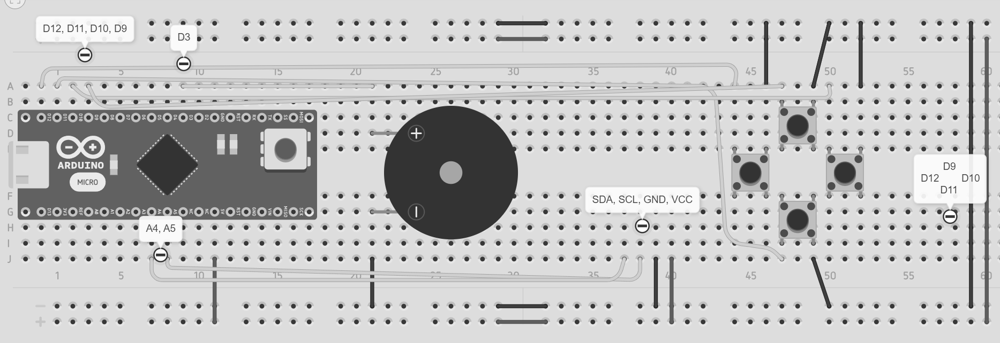

In [10]:
# Convert our image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)

In [11]:
# Function to generate noise
def generate_salt_pepper(shape):
  """Generate an image with a random noise"""
  return np.random.randint(low=0,high=255,size=shape)

def generate_salt_pepper_gaussian(shape):
  """Generate an image with a gaussian noise"""
  return np.random.normal(127,50,size=shape) # arguements = mean, std, size


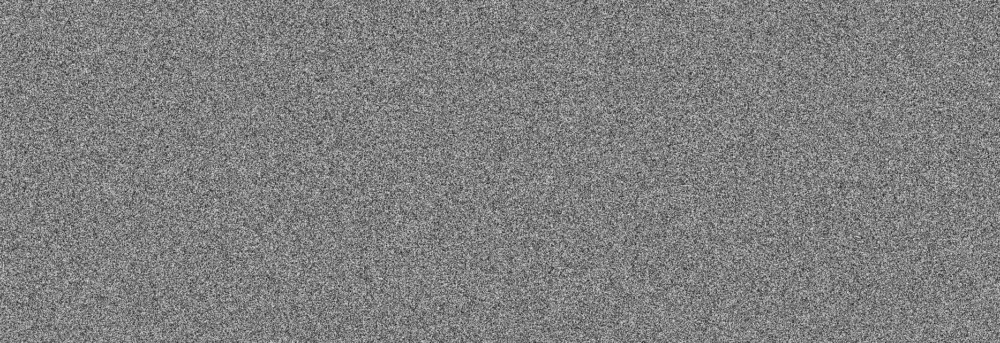

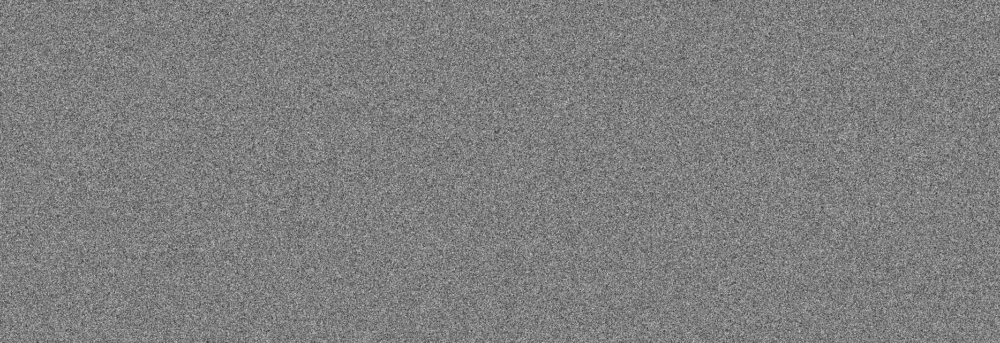

In [12]:
# View our noise
img_noise = generate_salt_pepper(gray_img.shape)
img_noise_gaussian = generate_salt_pepper_gaussian(gray_img.shape)
cv2_imshow(img_noise)
cv2_imshow(img_noise_gaussian)

509


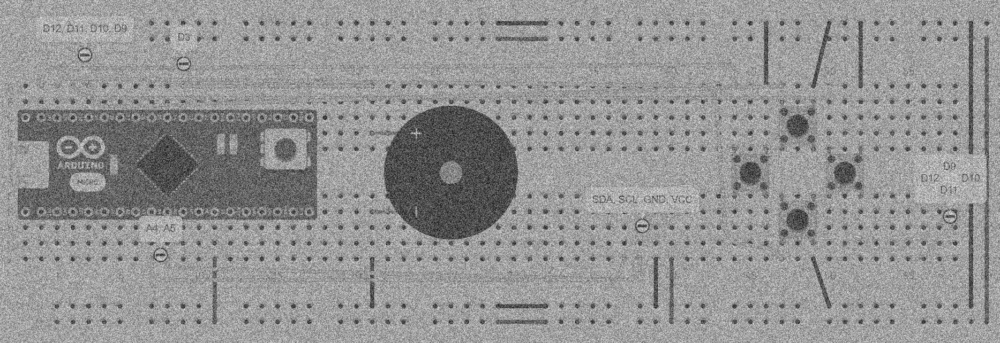

509


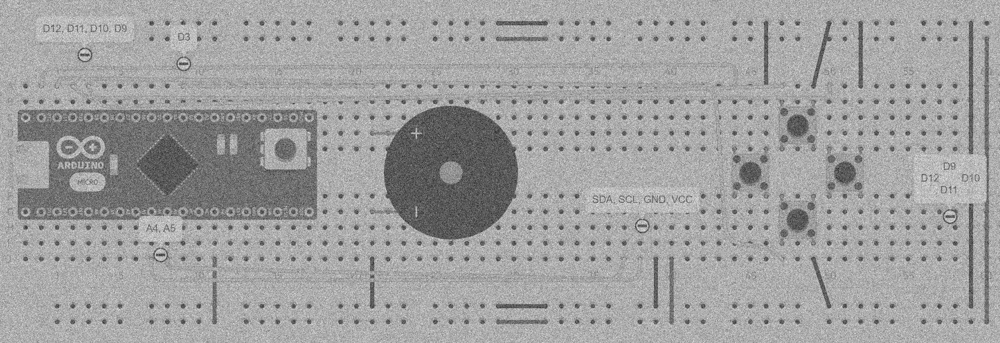

True

In [39]:
# Apply the image to our grayscale image
# Random noise
noisy_gray_img = (gray_img + img_noise)
pixel_minimum = np.min(noisy_gray_img)
pixel_maximum = np.max(noisy_gray_img)
noisy_gray_img -= pixel_minimum
noisy_gray_img = noisy_gray_img/(pixel_maximum/255)
cv2_imshow(noisy_gray_img)
cv2.imwrite('noisy_gray_img.jpg', noisy_gray_img)

# Gaussian noise
noisy_gray_img = (gray_img + img_noise)
pixel_minimum = np.min(noisy_gray_img)
pixel_maximum = np.max(noisy_gray_img)
noisy_gray_img -= pixel_minimum
noisy_gray_img = noisy_gray_img/(pixel_maximum/255)
noisy_gray_img = (gray_img + img_noise_gaussian)/2
cv2_imshow(noisy_gray_img)
cv2.imwrite('noisy_gray_img_gaussian.jpg', noisy_gray_img)

In [40]:
noisy_gray_img = cv2.imread('noisy_gray_img.jpg', cv2.IMREAD_GRAYSCALE)
noisy_gray_img_gaussian = cv2.imread('noisy_gray_img_gaussian.jpg', cv2.IMREAD_GRAYSCALE)

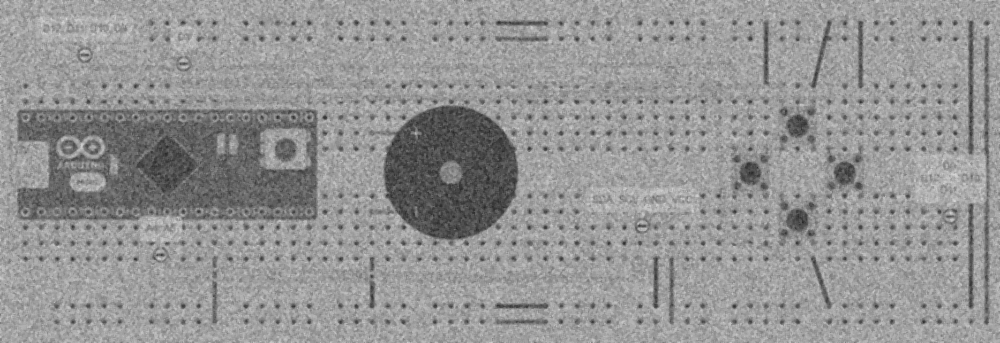

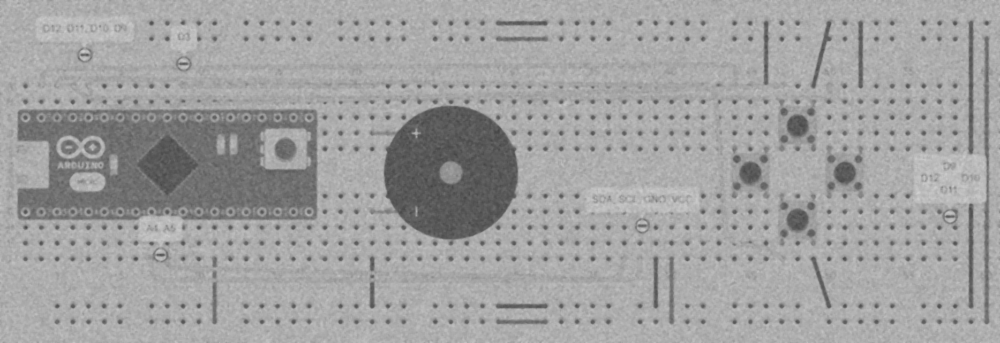

In [42]:
# Applying a median blur
filtered_img = cv2.medianBlur(noisy_gray_img, ksize = 5)
filtered_img_gaussian = cv2.medianBlur(noisy_gray_img_gaussian, ksize = 5)

cv2_imshow(filtered_img)
cv2_imshow(filtered_img_gaussian)

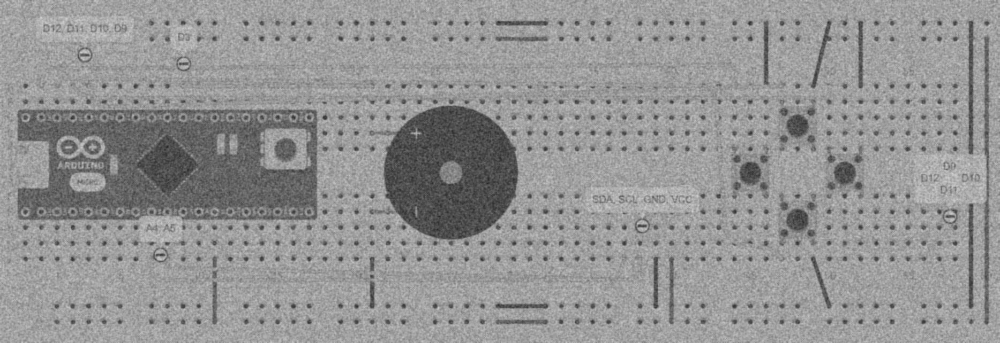

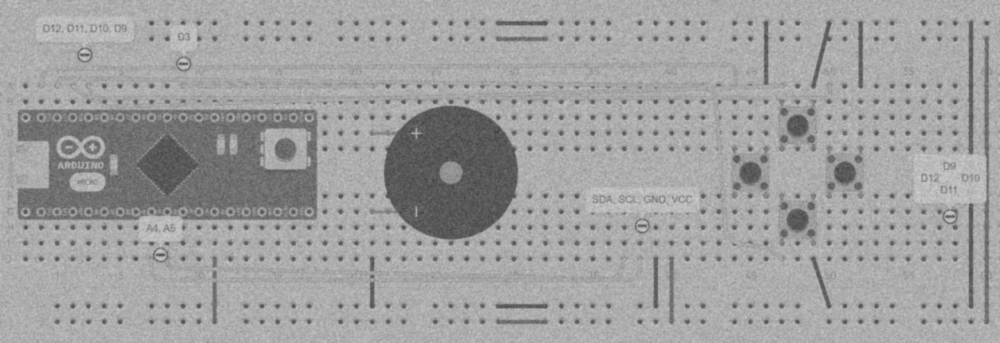

In [43]:
# Applying a bilateral filter

filtered_img = cv2.bilateralFilter(noisy_gray_img, 5, 200, 200)
filtered_img_gaussian = cv2.bilateralFilter(noisy_gray_img_gaussian, 5, 200, 200)

cv2_imshow(filtered_img)
cv2_imshow(filtered_img_gaussian)

## A different salt and pepper model
Not every pixel should be noisy

In [44]:
# Create a function that takes in the image, and a probability that a pixel become noisy

def generate_salt_pepper_selective(image, prob):
    output = np.copy(image) # Copy input image to output
    noisy = np.random.randint(low=0,high=255,size=output.shape)
    random = np.random.rand(*output.shape)
    # mask = if random is less than prob*100, then it should be 1, else it should be 0
    mask = random < prob
    # if mask is 1, take pixel from noisy, else take picture from output
    output[mask] = noisy[mask]

    return output

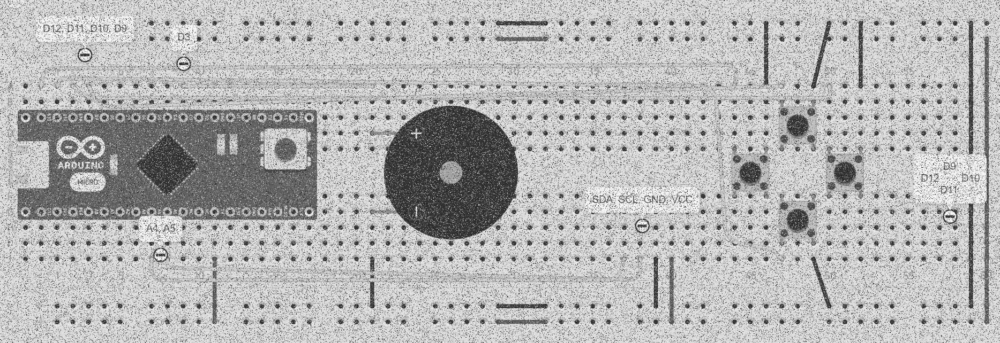

In [45]:
selective_noisy_image = generate_salt_pepper_selective(gray_img, 0.5)
cv2_imshow(selective_noisy_image)

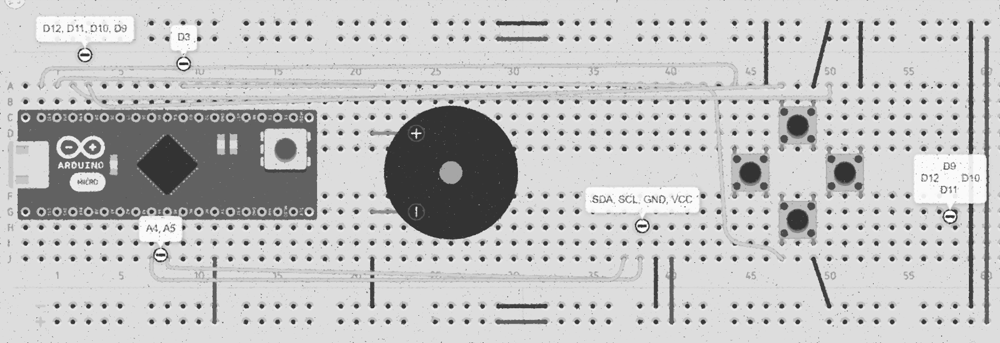

In [46]:
# Applying a median blur
filtered_img_selective = cv2.medianBlur(selective_noisy_image, ksize = 3)

cv2_imshow(filtered_img_selective)

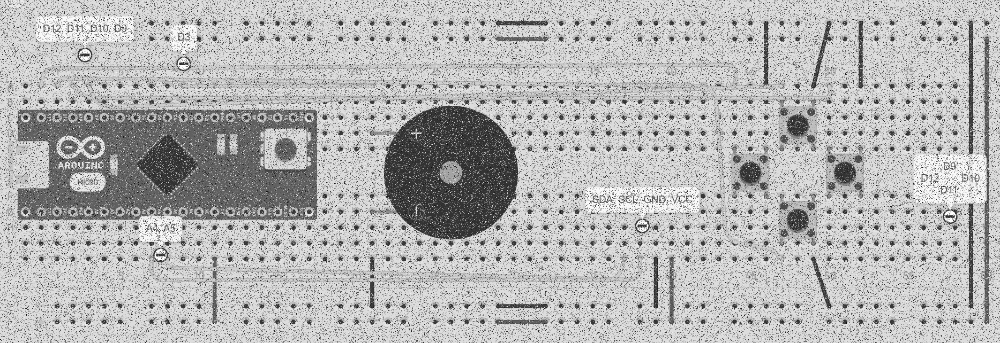

In [47]:
# Applying a bilateral filter
filtered_img_selective = cv2.bilateralFilter(selective_noisy_image, 3, 10, 10)

cv2_imshow(filtered_img_selective)